<a href="https://colab.research.google.com/github/oxayavongsa/aai-521-computer-vision-final/blob/main/Model_EasyOCR-and-TrOCR_Complete.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Install Libraries


In [ ]:
# Install Libraries (Install if needed)
# !apt-get install -y tesseract-ocr
# !pip install pytesseract
# !pip install torch torchvision transformers tqdm
# !pip install tqdm
# !pip install tensorflow matplotlib opencv-python-headless
# !pip install easyocr
# !pip install pyarrow
# !pip install fastparquet
# !pip install datasets
# !pip install evaluate
# !pip install jiwer

### Import Libraries

In [ ]:
# --- SYSTEM AND FILE HANDLING ---
import os
import random
from zipfile import ZipFile
from shutil import copyfile

# --- DATA MANIPULATION ---
import json
import numpy as np
import pandas as pd

# --- METRICS AND ERROR MEASUREMENTS ---
from jiwer import cer, wer

# --- IMAGE PROCESSING ---
import cv2
from PIL import Image, ImageStat
import pytesseract

# --- DATA VISUALIZATION ---
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from tqdm import tqdm

# --- DEEP LEARNING LIBRARIES ---
import torch
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, Resize, ToTensor

# --- TRANSFORMERS AND OCR MODELS ---
from transformers import (
    TrOCRProcessor,
    VisionEncoderDecoderModel,
    Seq2SeqTrainer,
    Seq2SeqTrainingArguments,
    AdamW,
    get_scheduler,
)
from datasets import Dataset, DatasetDict
import evaluate  # Correctly replace load_metric

# --- OCR LIBRARIES ---
import easyocr

# --- WARNINGS SUPPRESSION ---
import warnings
import logging
from transformers import logging as hf_logging

# Set up logging to suppress unnecessary warnings and info messages
warnings.filterwarnings("ignore")  # Suppress all Python warnings
hf_logging.set_verbosity_error()  # Suppress specific transformers warnings
logging.getLogger("transformers").setLevel(logging.ERROR)  # Set logging level for transformers library

### Collect and Load Data

In [ ]:
# --- MOUNT GOOGLE DRIVE ---
from google.colab import drive

print("Mounting Google Drive...")
drive.mount('/content/drive')

google_drive_path = "/content/drive/My Drive/Colab Notebooks/AAI-521-Computer Vision Dataset/"
print("Available files:", os.listdir(google_drive_path))

Mounting Google Drive...
Mounted at /content/drive
Available files: ['TextOCR Dataset.zip', 'TextOCR Dataset.zip (Unzipped Files)', 'TextOCR_test_Images_filtered.zip', 'preprocessed_images.zip', 'output_images.zip', 'Model_TcOCR_Final_Version2.ipynb']


### Understanding Data

In [ ]:
# Correct path to the dataset
google_drive_zip_path = "/content/drive/My Drive/Colab Notebooks/AAI-521-Computer Vision Dataset/TextOCR Dataset.zip"
unzipped_folder = "/content/unzipped_dataset"


def unzip_dataset(zip_path, extract_to):
    if os.path.exists(zip_path):
        print(f"Extracting dataset from {zip_path}...")

        # Open the zip file
        with ZipFile(zip_path, 'r') as zip_ref:
            # Get the list of files to extract
            file_list = zip_ref.namelist()

            # Create a progress bar for extraction
            for file in tqdm(file_list, desc="Extracting", unit="file"):
                zip_ref.extract(file, extract_to)

        print(f"Dataset extracted to {extract_to}")
    else:
        raise FileNotFoundError(f"Zip file not found at {zip_path}")


# Unzip the dataset with progress bar
unzip_dataset(google_drive_zip_path, unzipped_folder)

# List the unzipped dataset
print("\n----- Top Level Files -----")
!ls /content/unzipped_dataset

# Optionally, find all directories within the unzipped dataset
print("\n----- Dataset Directory -----")
!find /content/unzipped_dataset -type d

Extracting dataset from /content/drive/My Drive/Colab Notebooks/AAI-521-Computer Vision Dataset/TextOCR Dataset.zip...


Extracting: 100%|██████████| 25124/25124 [02:13<00:00, 188.44file/s]

Dataset extracted to /content/unzipped_dataset

----- Top Level Files -----
annot.csv  annot.parquet  img.csv  img.parquet	TextOCR_0.1_train.json	train_val_images



----- Dataset Directory -----
/content/unzipped_dataset
/content/unzipped_dataset/train_val_images
/content/unzipped_dataset/train_val_images/train_images


In [ ]:
# ~~~~~ Top Level Files ~~~~~ Data Sample
# Correct paths to dataset files and folders
base_path = "/content/unzipped_dataset"
csv_files = [os.path.join(base_path, "annot.csv"), os.path.join(base_path, "img.csv")]
parquet_files = [os.path.join(base_path, "annot.parquet"), os.path.join(base_path, "img.parquet")]
json_file = os.path.join(base_path, "TextOCR_0.1_train.json")
image_folder = os.path.join(base_path, "train_val_images/train_images")

# Prepare a dictionary to store file samples for visualization
file_samples = {}

# Load and collect CSV file samples
for file in csv_files:
    try:
        df = pd.read_csv(file)
        file_samples[file] = df.head()  # Collect first 5 rows
    except Exception as e:
        file_samples[file] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Load and collect Parquet file samples
for file in parquet_files:
    try:
        df = pd.read_parquet(file)
        file_samples[file] = df.head()  # Collect first 5 rows
    except Exception as e:
        file_samples[file] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Load and collect JSON file samples
try:
    with open(json_file, 'r') as f:
        data = json.load(f)
        # Convert first 5 keys and values to DataFrame
        json_sample = {k: data[k] for k in list(data.keys())[:5]}
        file_samples[json_file] = pd.DataFrame.from_dict(json_sample, orient='index', columns=['Value'])
except Exception as e:
    file_samples[json_file] = pd.DataFrame({"Error": [str(e)]})

# Load and collect image folder sample
try:
    image_sample = os.listdir(image_folder)[:5]
    file_samples[image_folder] = pd.DataFrame({"Images": image_sample})  # Convert filenames to DataFrame
except Exception as e:
    file_samples[image_folder] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Display DataFrame contents
for file_path, sample_df in file_samples.items():
    print(f"--- Sample from {file_path} ---")
    print(sample_df)

--- Sample from /content/unzipped_dataset/annot.csv ---
   Unnamed: 0                  id          image_id  \
0           0  a4ea732cd3d5948a_1  a4ea732cd3d5948a   
1           1  a4ea732cd3d5948a_2  a4ea732cd3d5948a   
2           2  a4ea732cd3d5948a_3  a4ea732cd3d5948a   
3           3  a4ea732cd3d5948a_4  a4ea732cd3d5948a   
4           4  a4ea732cd3d5948a_5  a4ea732cd3d5948a   

                            bbox  utf8_string  \
0   [525.83, 3.4, 197.64, 33.94]  Performance   
1  [534.67, 64.68, 91.22, 38.19]        Sport   
2  [626.95, 63.62, 96.52, 31.82]        Watch   
3  [577.4, 141.87, 147.13, 43.1]   ...period.   
4  [391.03, 163.9, 60.82, 38.65]            .   

                                              points     area  
0  [525.83, 3.4, 723.47, 7.29, 722.76, 36.99, 525...  6707.90  
1  [535.73, 64.68, 623.41, 67.51, 625.89, 102.87,...  3483.69  
2  [626.95, 63.62, 721.7, 63.62, 723.47, 95.44, 6...  3071.27  
3  [580.02, 143.61, 724.53, 141.87, 723.66, 184.9...  6341.30 

### Achieving Ground Truth

In [ ]:
# --- Loading Annotations ---
json_path = "/content/unzipped_dataset/TextOCR_0.1_train.json"  # Path to JSON annotation file
annot_csv_path = "/content/unzipped_dataset/annot.csv"          # CSV annotations file
img_csv_path = "/content/unzipped_dataset/img.csv"              # Image metadata CSV
image_folder = "/content/unzipped_dataset/train_val_images/train_images"  # Folder with images

# Load JSON annotations
with open(json_path, "r") as f:
    json_data = json.load(f)  # Load the JSON annotations

# Load CSV annotations and image metadata
annot_df = pd.read_csv(annot_csv_path)  # Load annotations from CSV
img_metadata_df = pd.read_csv(img_csv_path)  # Load image metadata

# Merge CSV annotations and image metadata
merged_df = pd.merge(
    annot_df, img_metadata_df,
    left_on="image_id", right_on="id",
    how="inner"
)

# Add file paths to the merged DataFrame
merged_df["file_path"] = merged_df["file_name"].apply(
    lambda x: os.path.join(image_folder, x)
)

# --- Preparing Ground Truth Data ---
image_text_pairs = []

# Validate JSON structure and debug keys
if "imgs" in json_data and "anns" in json_data and "imgToAnns" in json_data:
    print("JSON keys are valid. Proceeding...")
else:
    print("JSON keys missing. Check JSON structure:")
    print(json_data.keys())

for img_id, metadata in json_data.get("imgs", {}).items():
    file_name = metadata.get("file_name", "")
    corrected_file_name = file_name.replace("train/", "")
    img_path = os.path.join(image_folder, corrected_file_name)

    if not os.path.exists(img_path):
        print(f"Image path not found: {img_path}")
        continue

    # Debugging the annotations linked to the image
    ann_ids = json_data.get("imgToAnns", {}).get(img_id, [])
    if not ann_ids:
        print(f"No annotations found for image ID: {img_id}")
        continue

    text_annotations = []
    for ann_id in ann_ids:
        annotation = json_data["anns"].get(ann_id, {})
        utf8_string = annotation.get("utf8_string", "")
        if not utf8_string:
            print(f"Annotation missing text for ID: {ann_id}")
        else:
            text_annotations.append(utf8_string)

    # Concatenate annotations
    full_text = " ".join(text_annotations)
    image_text_pairs.append({"image_path": img_path, "text": full_text})

if not image_text_pairs:
    print("No valid image-text pairs were found. Debug the JSON annotations further.")

# Convert to DataFrame
ground_truth_df = pd.DataFrame(image_text_pairs)

# Display a sample of the prepared ground truth data
print(ground_truth_df.head())

JSON keys are valid. Proceeding...
                                          image_path  \
0  /content/unzipped_dataset/train_val_images/tra...   
1  /content/unzipped_dataset/train_val_images/tra...   
2  /content/unzipped_dataset/train_val_images/tra...   
3  /content/unzipped_dataset/train_val_images/tra...   
4  /content/unzipped_dataset/train_val_images/tra...   

                                                text  
0  Performance Sport Watch ...period. . 400 300 1...  
1  400 Z 7 at nLa A. James LYNCH REAL ESTATE 781....  
2  CAOL ILA DISTILLERY 1996 GLE MALT SCOTCH WHISK...  
3                                     G-ATCO HUSKY +  
4  OUR NEIGHBORS, THE FRIENDS . . . 1 Muhomah . f...  


### Ground Truth Image Sample

In [ ]:
def visualize_ground_truth(image_path, image_annotations):
    """
    Visualize the ground truth annotations (bounding boxes and text) on the image.
    """
    image = Image.open(image_path)
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image)

    for annotation in image_annotations:
        bbox = annotation["bbox"]  # [x, y, width, height]
        text = annotation["utf8_string"]

        # Draw bounding box
        rect = patches.Rectangle(
            (bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor="red", facecolor="none"
        )
        ax.add_patch(rect)

        # Display text
        ax.text(
            bbox[0], bbox[1] - 10, text, fontsize=12, color="blue",
            bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", boxstyle="round,pad=0.3")
        )

    plt.axis("off")
    plt.show()

Visualizing before merging:


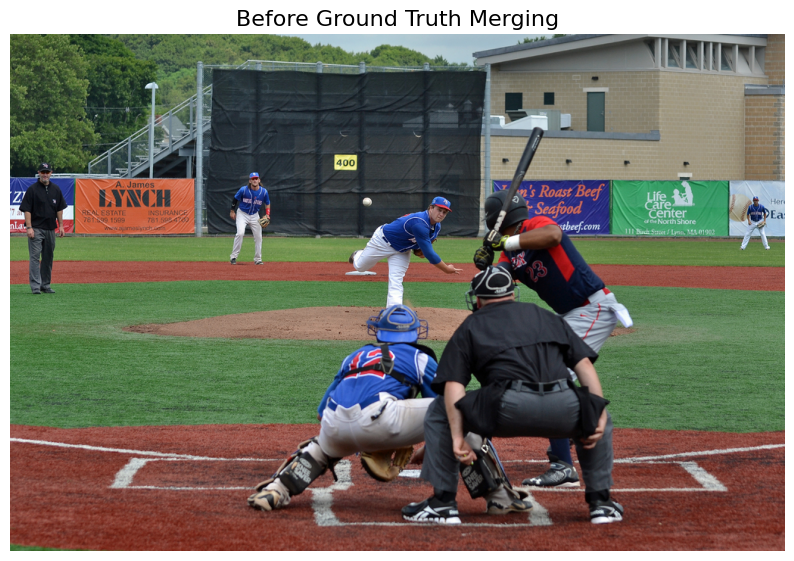


Visualizing after merging:


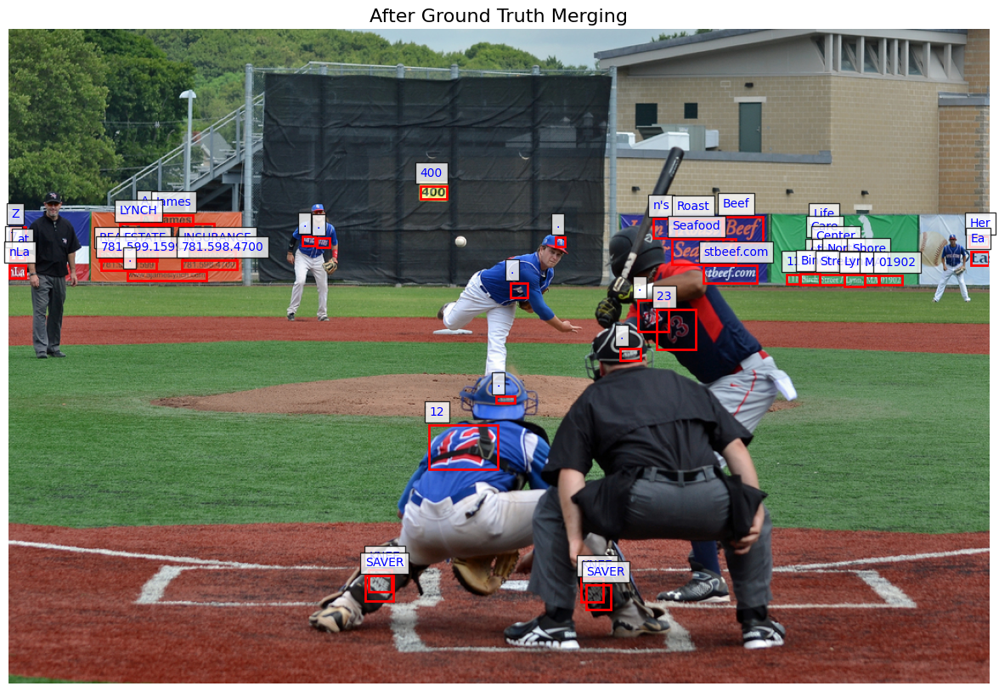

In [ ]:
# Function to visualize the image before annotations
def visualize_before_merge(image_path):
    """
    Display the image without annotations (before merging).

    Args:
    - image_path (str): Path to the image file.
    """
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return

    # Load the image
    image = plt.imread(image_path)

    # Display the image
    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.title("Before Ground Truth Merging", fontsize=16)
    plt.axis('off')
    plt.show()

# Function to visualize the image after annotations
def visualize_after_merge(image_path, annotations):
    """
    Visualize the image with bounding boxes and labels (after merging).

    Args:
    - image_path (str): Path to the image file.
    - annotations (list of tuples): List of (label, bbox) tuples.
    """
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return

    # Load the image
    image = plt.imread(image_path)

    # Set up the plot
    fig, ax = plt.subplots(1, figsize=(15, 10))
    ax.imshow(image)

    # Add bounding boxes and labels
    for label, bbox in annotations:
        # Ensure bbox is a list (if stored as a string)
        if isinstance(bbox, str):
            bbox = eval(bbox)

        # Draw the bounding box
        rect = patches.Rectangle(
            (bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor="red", facecolor="none"
        )
        ax.add_patch(rect)

        # Add the label above the bounding box
        ax.text(
            bbox[0], bbox[1] - 10, label, fontsize=10, color="blue",
            bbox=dict(facecolor="white", alpha=0.8)
        )

    plt.axis('off')
    plt.title("After Ground Truth Merging", fontsize=16)
    plt.show()


# File path for the specific image
image_path = "/content/unzipped_dataset/train_val_images/train_images/4bf43a7b2a898044.jpg"

# Define the annotations (label and bbox pairs)
annotations = [
    ("400", [429.44, 163.75, 27.52, 13.0]),
    ("Z", [2.52, 206.33, 14.29, 18.56]),
    ("7", [1.21, 229.65, 5.91, 11.33]),
    ("at", [8.11, 232.44, 8.54, 8.7]),
    ("nLa", [0.23, 246.23, 17.24, 12.81]),
    ("A.", [138.01, 192.86, 13.63, 11.33]),
    ("James", [153.61, 193.36, 38.43, 10.83]),
    ("LYNCH", [115.51, 202.88, 98.7, 27.43]),
    ("REAL", [94.32, 231.13, 24.47, 10.18]),
    ("ESTATE", [119.61, 231.29, 34.98, 10.18]),
    ("781.599.1599", [96.13, 240.32, 57.48, 11.17]),
    ("INSURANCE", [181.53, 230.96, 54.68, 9.69]),
    ("781.598.4700", [180.38, 240.65, 57.31, 10.02]),
    (".", [123.88, 252.48, 82.44, 9.52]),
    (".", [306.66, 215.53, 13.14, 9.85]),
    (".", [321.12, 217.66, 13.46, 10.18]),
    (".", [508.81, 382.92, 19.62, 6.98]),
    ("12", [439.01, 412.72, 71.5, 46.03]),
    (".", [571.09, 216.87, 9.19, 9.86]),
    (".", [656.64, 282.71, 32.03, 32.88]),
    ("23", [676.66, 292.43, 40.31, 41.17]),
    ("n's", [672.66, 197.52, 23.62, 19.94]),
    ("Roast", [696.93, 197.95, 47.67, 19.51]),
    ("Beef", [745.04, 195.79, 42.47, 26.65]),
    ("Seafood", [692.6, 218.97, 66.31, 25.79]),
    ("stbeef.com", [725.32, 245.84, 55.91, 18.85]),
    ("Life", [839.95, 205.97, 28.6, 16.47]),
    ("Care", [837.35, 219.41, 37.92, 14.73]),
    ("Center", [842.77, 229.59, 52.87, 15.82]),
    ("of", [836.05, 243.46, 9.32, 8.23]),
    ("the", [843.85, 243.68, 11.92, 8.01]),
    ("North", [854.47, 242.16, 27.08, 10.4]),
    ("Shore", [880.04, 242.38, 27.52, 10.61]),
    ("111", [811.92, 255.67, 13.63, 9.69]),
    ("Binch", [826.37, 255.02, 19.87, 11.33]),
    ("Street/", [846.89, 255.67, 25.46, 10.68]),
    ("Lyna,", [872.18, 256.16, 21.35, 12.16]),
    ("MA", [893.53, 256.66, 15.44, 10.01]),
    ("01902", [907.82, 256.49, 24.63, 10.18]),
    ("Her", [1003.13, 216.15, 19.87, 10.51]),
    ("Ea", [1004.11, 231.75, 18.72, 14.12]),
    (".", [637.9, 333.09, 21.34, 12.48]),
    ("KNEE", [597.52, 572.86, 23.19, 24.49]),
    ("SAVER", [602.72, 579.37, 26.01, 26.0]),
    ("KNEE", [375.82, 563.72, 23.62, 22.97]),
    ("SAVER", [371.92, 570.22, 29.25, 26.44]),
    (".", [523.51, 264.31, 17.74, 15.11]),
]

# Visualize the image before merging
print("Visualizing before merging:")
visualize_before_merge(image_path)

# Visualize the image after merging
print("\nVisualizing after merging:")
visualize_after_merge(image_path, annotations)

<i>**Ground truth** generation involved meticulously merging annotations, image metadata, and bounding box coordinates to ensure accurate alignment between images and their corresponding text content. This process integrated data from multiple sources, including the JSON annotation file (TextOCR_0.1_train.json), annotation CSV file (annot.csv), and image metadata CSV file (img.csv). The merging was conducted using shared identifiers such as image_id, enabling a comprehensive and structured dataset.</i>

<i>Each image was linked with its bounding boxes and corresponding text annotations (utf8_string), with bounding box coordinates (bbox) extracted to determine the spatial layout of the text within the image. For instance, in the sample image "4bf43a7b2a898044.jpg," annotations included text such as "400", "Seafood", and "KNEE SAVER", each accurately positioned within bounding boxes that matched their locations on the image.</i>

### Display Data Images

Displaying the first 20 images from the dataset...


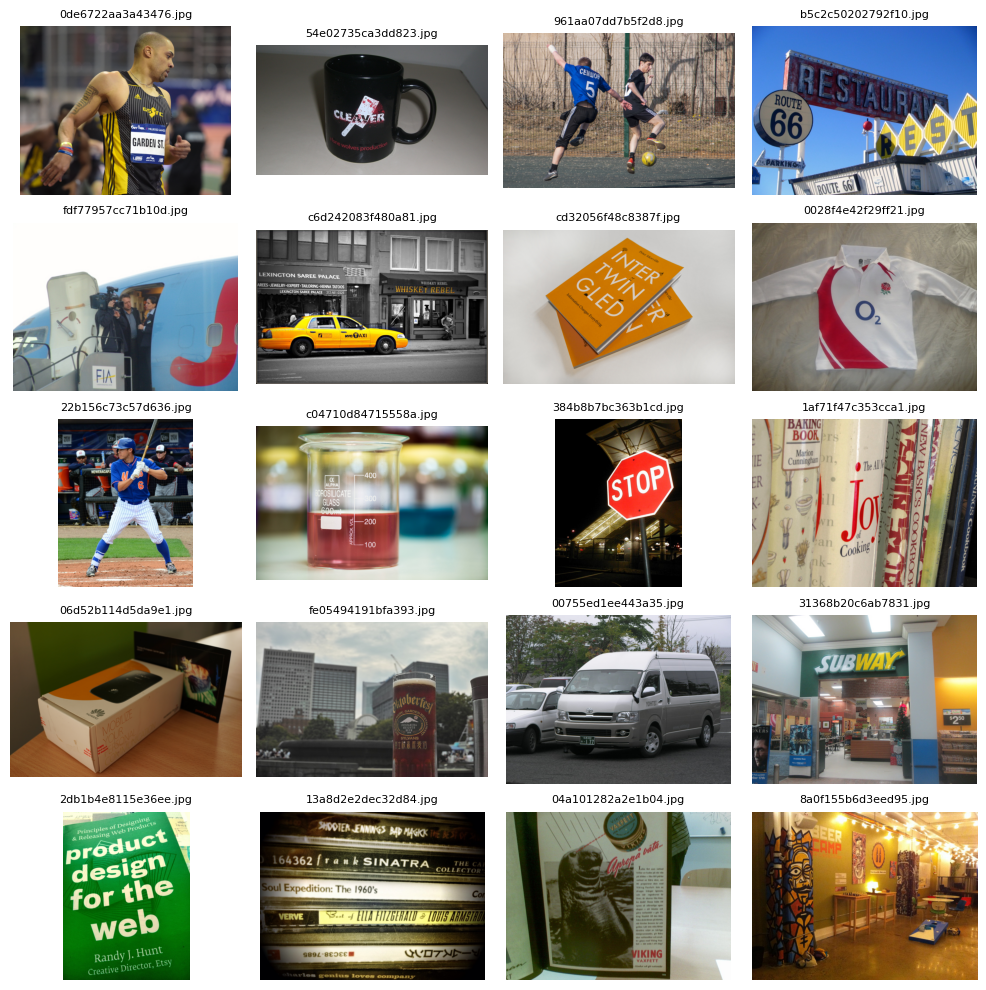

In [ ]:
# Update the folder path to the correct image directory
unzipped_folder = "/content/unzipped_dataset/train_val_images/train_images"


def display_sample_images(folder, num_images=20):
    valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')
    image_files = [f for f in os.listdir(folder) if f.lower().endswith(valid_extensions)]
    image_files = image_files[:num_images]  # Limit to the first `num_images`

    if not image_files:
        print("No images found in the folder.")
        return

    # Display images in a grid
    plt.figure(figsize=(10, 10))
    for i, image_name in enumerate(image_files, start=1):
        image_path = os.path.join(folder, image_name)
        image = cv2.imread(image_path)
        if image is not None:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display
            plt.subplot(5, 4, i)  # Create a grid of 5 rows and 4 columns
            plt.imshow(image)
            plt.title(image_name, fontsize=8)
            plt.axis('off')
        else:
            print(f"Unable to read image: {image_name}")
    plt.tight_layout()
    plt.show()


# Display the first 20 images
print("Displaying the first 20 images from the dataset...")
display_sample_images(unzipped_folder)

### Data Cleaning

Processing Images: 100%|██████████| 25119/25119 [34:34<00:00, 12.11image/s]



Total images processed: 25119
Total OCR-ready images saved in '/content/test_images': 21266
Total non-OCR-ready images saved in '/content/disposed_images': 3853
Visualizing first 10 OCR-ready images from /content/test_images...


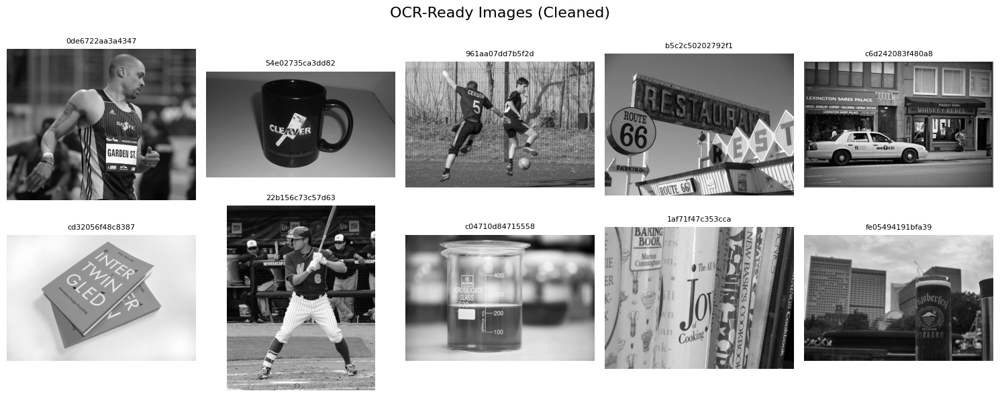

Visualizing first 10 non-OCR-ready images from /content/disposed_images...


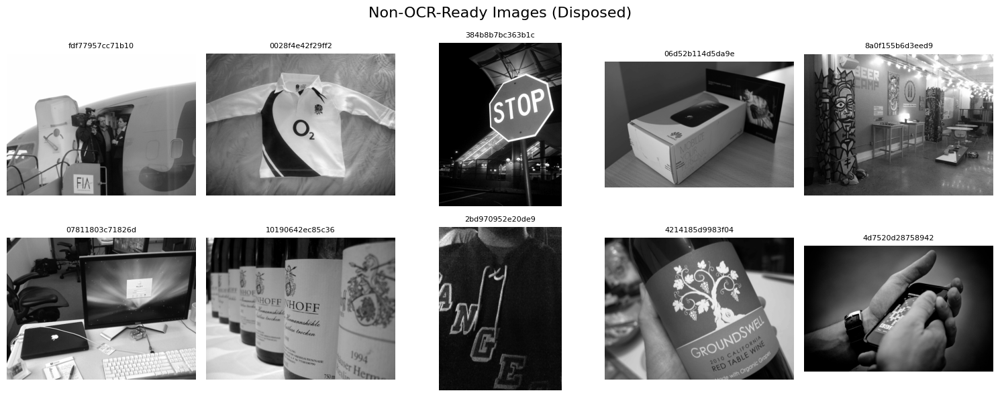

In [ ]:
# Thresholds for quality checks
BRIGHTNESS_THRESHOLD = 50
CONTRAST_THRESHOLD = 20
SHARPNESS_THRESHOLD = 100

# Paths for input and output folders
input_folder = "/content/unzipped_dataset/train_val_images/train_images"
ocr_ready_folder = "/content/test_images"  # Folder for OCR-ready images
non_ocr_ready_folder = "/content/disposed_images"  # Folder for non-OCR-ready images
os.makedirs(ocr_ready_folder, exist_ok=True)  # Ensure OCR-ready folder exists
os.makedirs(non_ocr_ready_folder, exist_ok=True)  # Ensure non-OCR-ready folder exists

# Functions for image quality evaluation
def calculate_brightness(image):
    """Calculate brightness of an image."""
    pil_image = Image.fromarray(image)
    stat = ImageStat.Stat(pil_image)
    return stat.mean[0]

def calculate_contrast(image):
    """Calculate contrast of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray.std()

def calculate_sharpness(image):
    """Calculate sharpness of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def contains_text(image_path):
    """Check if an image contains text using Tesseract OCR."""
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    text = pytesseract.image_to_string(image)
    return len(text.strip()) > 0

# Function to clean and categorize images
def clean_images(input_folder, ocr_ready_folder, non_ocr_ready_folder):
    valid_images = []
    non_ocr_ready_images = []

    for image_name in tqdm(os.listdir(input_folder), desc="Processing Images", unit="image"):
        image_path = os.path.join(input_folder, image_name)
        if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            continue

        # Read and evaluate the image
        image = cv2.imread(image_path)
        if image is None:
            continue  # Skip unreadable images

        try:
            # Calculate quality metrics
            brightness = calculate_brightness(image)
            contrast = calculate_contrast(image)
            sharpness = calculate_sharpness(image)

            # Check if the image meets OCR readiness criteria or contains text
            if (
                brightness >= BRIGHTNESS_THRESHOLD and
                contrast >= CONTRAST_THRESHOLD and
                sharpness >= SHARPNESS_THRESHOLD
            ) or contains_text(image_path):
                # Save OCR-ready image
                copyfile(image_path, os.path.join(ocr_ready_folder, image_name))
                valid_images.append(image_name)
            else:
                # Save non-OCR-ready image
                copyfile(image_path, os.path.join(non_ocr_ready_folder, image_name))
                non_ocr_ready_images.append(image_name)
        except Exception as e:
            print(f"Error processing {image_name}: {e}")

    return valid_images, non_ocr_ready_images

# Function to visualize images in a 2x5 grid
def visualize_images(folder, title, num_images=10):
    """Display images in a 2x5 grid."""
    files = os.listdir(folder)[:num_images]  # Get the first `num_images` files
    rows, cols = 2, 5  # Define grid dimensions
    plt.figure(figsize=(15, 6))
    for i, file in enumerate(files, 1):
        img_path = os.path.join(folder, file)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load image in grayscale
        if img is not None:
            plt.subplot(rows, cols, i)
            plt.imshow(img, cmap='gray')
            plt.title(file[:15], fontsize=8)  # Truncate file names for readability
            plt.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Run the cleaning process
ocr_ready_images, non_ocr_ready_images = clean_images(input_folder, ocr_ready_folder, non_ocr_ready_folder)

# Summary of results
print(f"\nTotal images processed: {len(os.listdir(input_folder))}")
print(f"Total OCR-ready images saved in '{ocr_ready_folder}': {len(ocr_ready_images)}")
print(f"Total non-OCR-ready images saved in '{non_ocr_ready_folder}': {len(non_ocr_ready_images)}")

# Visualize OCR-ready images
print(f"Visualizing first 10 OCR-ready images from {ocr_ready_folder}...")
visualize_images(ocr_ready_folder, title="OCR-Ready Images (Cleaned)")

# Visualize Non-OCR-ready images
print(f"Visualizing first 10 non-OCR-ready images from {non_ocr_ready_folder}...")
visualize_images(non_ocr_ready_folder, title="Non-OCR-Ready Images (Disposed)")

### Exploratory Data Analysis

In [ ]:
# Paths
clean_folder = "/content/test_images"  # Folder with clean images
output_csv = "/content/eda_results.csv"  # CSV to save EDA results

# Helper functions for feature extraction
def calculate_brightness(image):
    """Calculate brightness of an image."""
    image = Image.fromarray(image)
    stat = ImageStat.Stat(image)
    return stat.mean[0]

def calculate_contrast(image):
    """Calculate contrast of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray.std()

def calculate_sharpness(image):
    """Calculate sharpness of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F).var()
    return laplacian

# Process preprocessed images and extract features
def process_images_for_eda(folder):
    """Extract brightness, contrast, and sharpness for all valid images."""
    data = []
    valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')
    image_files = sorted([f for f in os.listdir(folder) if f.lower().endswith(valid_extensions)])

    # Add progress bar for processing
    for image_name in tqdm(image_files, desc="Analyzing Images", unit="image"):
        image_path = os.path.join(folder, image_name)

        # Read image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Unreadable image file: {image_name}")
            continue

        # Extract features
        try:
            brightness = calculate_brightness(image)
            contrast = calculate_contrast(image)
            sharpness = calculate_sharpness(image)
            height, width = image.shape[:2]
            data.append({
                "Image": image_name,
                "Brightness": brightness,
                "Contrast": contrast,
                "Sharpness": sharpness,
                "Width": width,
                "Height": height,
                "Aspect Ratio": width / height if height > 0 else None
            })
        except Exception as e:
            print(f"Error processing image {image_name}: {e}")

    return pd.DataFrame(data)

Starting EDA...


Analyzing Images: 100%|██████████| 21266/21266 [06:14<00:00, 56.75image/s]


EDA results saved to /content/eda_results.csv
Summary Statistics:
         Brightness      Contrast     Sharpness         Width        Height  \
count  21266.000000  21266.000000  21266.000000  21266.000000  21266.000000   
mean     107.533578     61.363905    774.817362    947.181463    813.612339   
std       37.141491     14.715217   1187.632535    149.536513    160.033975   
min        2.290301      9.156127      3.986215    256.000000    257.000000   
25%       81.443593     51.821058    225.975420    926.250000    683.000000   
50%      104.517960     61.242335    447.927146   1024.000000    768.000000   
75%      129.374201     70.807710    902.185206   1024.000000   1024.000000   
max      250.397028    120.472789  63304.231738   4608.000000   3456.000000   

       Aspect Ratio  
count  21266.000000  
mean       1.230953  
std        0.363947  
min        0.250000  
25%        0.994141  
50%        1.333333  
75%        1.499268  
max        3.984436  


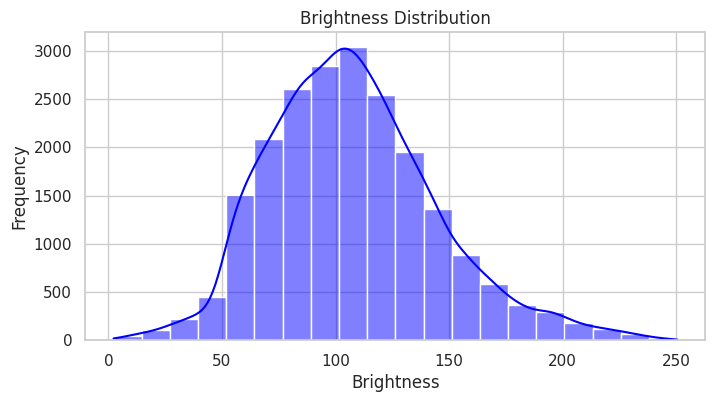

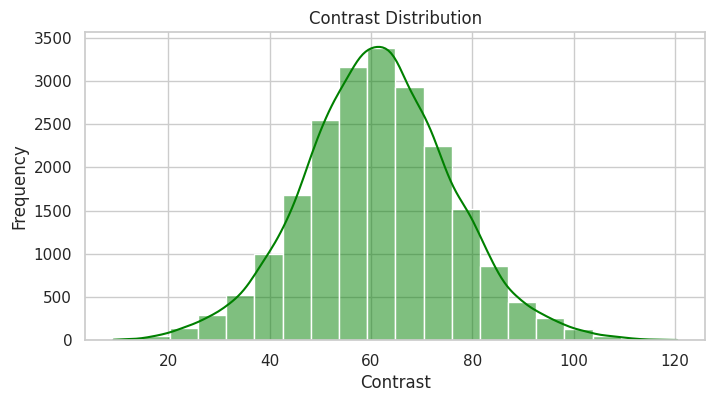

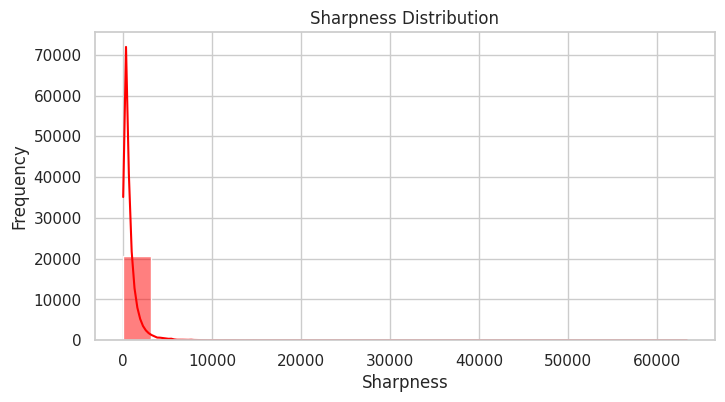

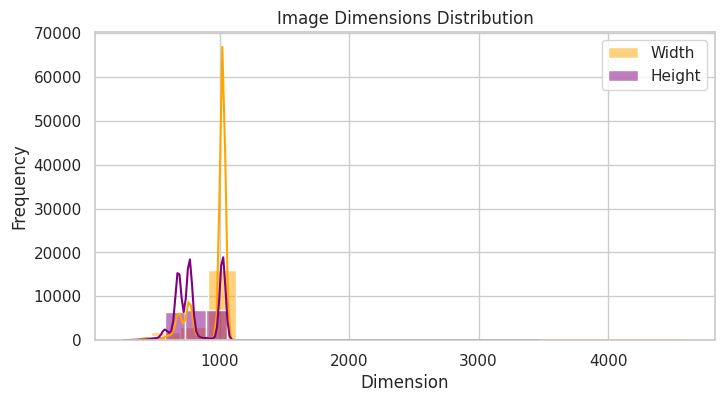

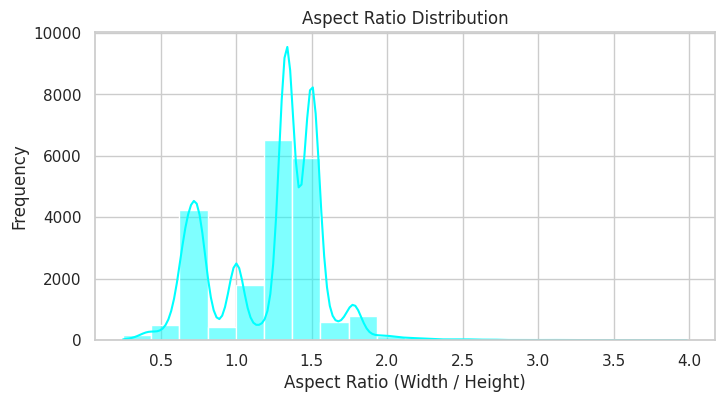

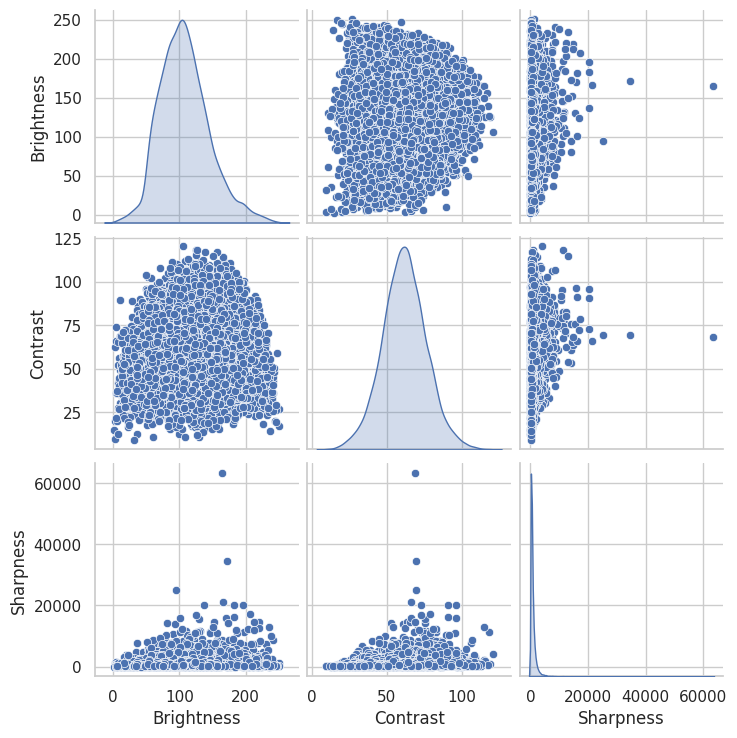

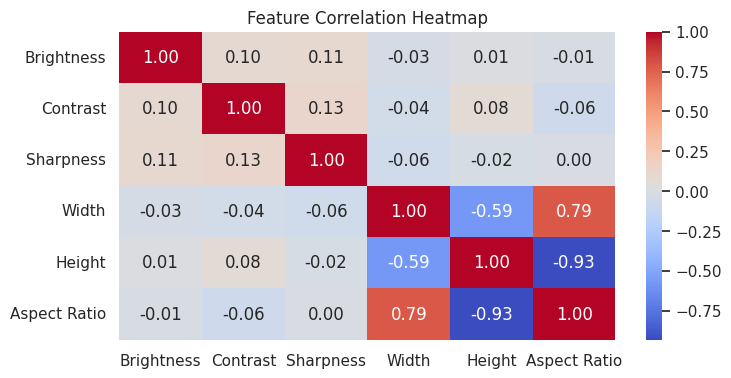

In [ ]:
# Extract features from clean images
print("Starting EDA...")
df = process_images_for_eda(clean_folder)

# Save EDA results and perform visualizations
if not df.empty:
    # Save results to CSV
    df.to_csv(output_csv, index=False)
    print(f"EDA results saved to {output_csv}")

    # Summary statistics
    print("Summary Statistics:")
    print(df.describe())

    # Visualizations
    sns.set(style="whitegrid")

    # Brightness Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Brightness"], bins=20, kde=True, color="blue")
    plt.title("Brightness Distribution")
    plt.xlabel("Brightness")
    plt.ylabel("Frequency")
    plt.show()

    # Contrast Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Contrast"], bins=20, kde=True, color="green")
    plt.title("Contrast Distribution")
    plt.xlabel("Contrast")
    plt.ylabel("Frequency")
    plt.show()

    # Sharpness Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Sharpness"], bins=20, kde=True, color="red")
    plt.title("Sharpness Distribution")
    plt.xlabel("Sharpness")
    plt.ylabel("Frequency")
    plt.show()

    # Image Dimensions Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Width"], bins=20, kde=True, color="orange", label="Width")
    sns.histplot(df["Height"], bins=20, kde=True, color="purple", label="Height")
    plt.title("Image Dimensions Distribution")
    plt.xlabel("Dimension")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

    # Aspect Ratio Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Aspect Ratio"], bins=20, kde=True, color="cyan")
    plt.title("Aspect Ratio Distribution")
    plt.xlabel("Aspect Ratio (Width / Height)")
    plt.ylabel("Frequency")
    plt.show()

    # Pairplot for relationships
    sns.pairplot(df, vars=["Brightness", "Contrast", "Sharpness"], diag_kind="kde")
    plt.show()

    # Correlation Heatmap
    plt.figure(figsize=(8, 4))
    corr = df[["Brightness", "Contrast", "Sharpness", "Width", "Height", "Aspect Ratio"]].corr()
    sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Feature Correlation Heatmap")
    plt.show()
else:
    print("No valid images processed. Ensure the clean folder contains valid image files.")

### Image Preprocessing

Visualizing first 5 preprocessed images from /content/output_images...


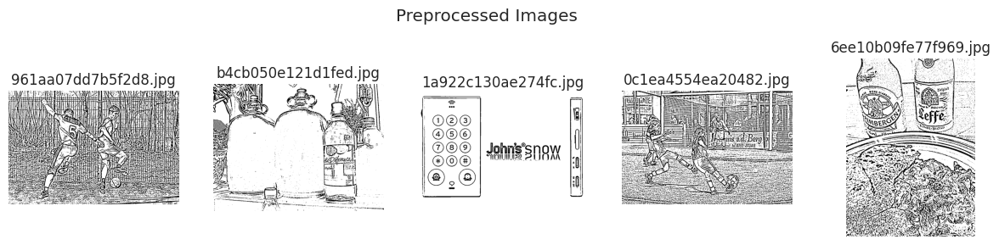

In [ ]:
# Input folder for preprocessing (use OCR-ready folder from cleaning step)
input_folder = ocr_ready_folder  # OCR-ready folder from cleaning
output_folder = "/content/output_images"  # Folder for preprocessed images
os.makedirs(output_folder, exist_ok=True)  # Ensure preprocessed folder exists


def preprocess_image(image_path, output_path):
    """
    Preprocess the image by applying grayscale conversion, Gaussian blur,
    binarization, deskewing, and controlled sharpening.
    """
    try:
        # Load the image
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Validate image loading
        if image is None:
            print(f"Could not read image: {image_path}")
            return

        # Apply Gaussian blur to reduce noise
        blurred = cv2.GaussianBlur(image, (5, 5), 0)

        # Apply adaptive thresholding for binarization
        binary = cv2.adaptiveThreshold(
            blurred, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY, 11, 2
        )

        # Deskew the image
        coords = np.column_stack(np.where(binary > 0))
        angle = cv2.minAreaRect(coords)[-1]
        if angle < -45:
            angle = -(90 + angle)
        else:
            angle = -angle

        # Limit deskew rotation angles to avoid overcorrection
        if abs(angle) > 20:
            print(f"Skipping excessive rotation for: {image_path}")
            return

        # Rotate image to deskew
        h, w = binary.shape[:2]
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        deskewed = cv2.warpAffine(
            binary, M, (w, h),
            flags=cv2.INTER_CUBIC,
            borderMode=cv2.BORDER_REPLICATE
        )

        # Apply controlled sharpening
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
        sharpened = cv2.filter2D(deskewed, -1, kernel)

        # Save preprocessed image
        cv2.imwrite(output_path, sharpened)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")


def preprocess_images(input_folder, output_folder):
    """
    Preprocess all images in the input folder and save to the output folder.
    """
    for image_name in tqdm(
        os.listdir(input_folder),
        desc="Preprocessing Images",
        unit="image"
    ):
        if image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            image_path = os.path.join(input_folder, image_name)
            output_path = os.path.join(output_folder, image_name)
            preprocess_image(image_path, output_path)


def visualize_images(folder, title="Images"):
    """
    Visualize the first 5 images in the given folder.
    """
    images = os.listdir(folder)[:5]  # Limit to the first 5 images
    plt.figure(figsize=(15, 6))
    for i, image_name in enumerate(images):
        image_path = os.path.join(folder, image_name)
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            plt.subplot(2, 5, i + 1)
            plt.imshow(img, cmap='gray')
            plt.title(image_name)
            plt.axis('off')
    plt.suptitle(title)
    plt.show()

# Visualize the first 5 preprocessed images
print(f"Visualizing first 5 preprocessed images from {output_folder}...")
visualize_images(output_folder, title="Preprocessed Images")

Modeling Methods: EasyOCR and TcOCR

In [ ]:
# EasyOCR, TrOCR, and PaddleOCR Model Setup
# Use the folder from the preprocessed images
output_folder = "/content/output_images"

# Instantiate EasyOCR Reader
def get_easyocr_reader():
    # Languages can be adjusted depending on the dataset
    reader = easyocr.Reader(["en"], gpu=torch.cuda.is_available())
    return reader

reader_easyocr = get_easyocr_reader()

# Preparing Dataset for OCR
def create_dataset(folder, limit=None):
    image_files = [f for f in os.listdir(folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]
    if limit:
        image_files = image_files[:limit]

    dataset = []
    for image_file in image_files:
        img_path = os.path.join(folder, image_file)
        dataset.append(img_path)
    return dataset

# Create datasets (e.g., training and validation datasets)
train_dataset = create_dataset(ocr_ready_folder, limit=2000)  # Use a subset for quicker evaluation
validation_dataset = create_dataset(ocr_ready_folder, limit=200)  # For validation

In [ ]:
# Modeling Methods: EasyOCR and TrOCR
# We are using two OCR models: EasyOCR and TrOCR. These 2 models are pre-trained

# Load pre-trained TrOCR model and processor
processor_trocr = TrOCRProcessor.from_pretrained("microsoft/trocr-base-printed")
model_trocr = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-base-printed")

preprocessor_config.json:   0%|          | 0.00/224 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.12k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.13k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

<br>
<b>Displayed as shown (above)</b>
<br>

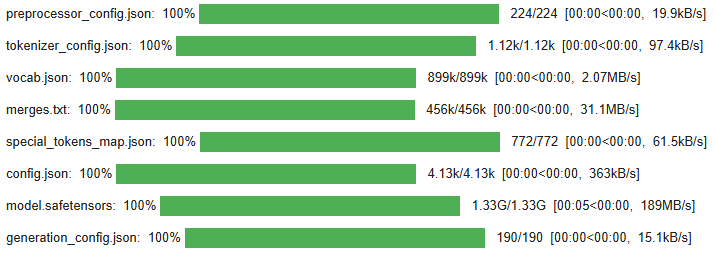

In [ ]:
# Evaluation Metrics for OCR
def evaluate_ocr(model_type, reader, dataset, ground_truths):
    total_wer, total_cer = 0, 0
    count = 0

    for image_path, ground_truth in tqdm(zip(dataset, ground_truths), desc=f"Evaluating Images ({model_type})", total=len(dataset)):
        if model_type == "EasyOCR":
            result = reader.readtext(image_path, detail=0)  # EasyOCR output
            predicted_text = ' '.join(result)
        elif model_type == "TrOCR":
            # Preprocess image for TrOCR
            image = Image.open(image_path).convert("RGB")
            pixel_values = processor_trocr(images=image, return_tensors="pt").pixel_values
            generated_ids = model_trocr.generate(pixel_values)
            predicted_text = processor_trocr.batch_decode(generated_ids, skip_special_tokens=True)[0]
        else:
            raise ValueError("Invalid OCR model type specified.")

        count += 1
        # Calculate word error rate (WER) and character error rate (CER)
        total_wer += wer(ground_truth, predicted_text)
        total_cer += cer(ground_truth, predicted_text)

    average_wer = total_wer / count if count > 0 else None
    average_cer = total_cer / count if count > 0 else None

    return average_wer, average_cer

In [ ]:
# To proceed with evaluation, we need ground truth text for each image (This requires an existing dataset with OCR annotations)
# If you have such dataset, replace the below line with actual ground truth loading.
# Placeholder for ground truth (can use the `ground_truth_df` for this purpose if annotations are already available)
ground_truths = ground_truth_df["text"].tolist()[:len(train_dataset)]  # Adjust the ground truth based on available images

# Validation and Performance Metrics
# Evaluate EasyOCR
print("Starting evaluation of EasyOCR model...")
average_wer_easyocr, average_cer_easyocr = evaluate_ocr("EasyOCR", reader_easyocr, train_dataset, ground_truths)
print(f"\nEasyOCR - Average Word Error Rate (WER): {average_wer_easyocr:.2f}")
print(f"EasyOCR - Average Character Error Rate (CER): {average_cer_easyocr:.2f}")

Starting evaluation of EasyOCR model...


Evaluating Images (EasyOCR): 100%|██████████| 2000/2000 [08:34<00:00,  3.88it/s]


EasyOCR - Average Word Error Rate (WER): 3.10
EasyOCR - Average Character Error Rate (CER): 3.87


In [ ]:
# Evaluate TrOCR
print("Starting evaluation of TrOCR model...")
average_wer_trocr, average_cer_trocr = evaluate_ocr("TrOCR", None, train_dataset, ground_truths)
print(f"\nTrOCR - Average Word Error Rate (WER): {average_wer_trocr:.2f}")
print(f"TrOCR - Average Character Error Rate (CER): {average_cer_trocr:.2f}")

Starting evaluation of TrOCR model...


Evaluating Images (TrOCR): 100%|██████████| 2000/2000 [20:36<00:00,  1.62it/s]


TrOCR - Average Word Error Rate (WER): 1.00
TrOCR - Average Character Error Rate (CER): 0.99


*Note: For TrOCR, the evaluation uses processor_trocr and model_trocr, and the reader parameter is not referenced. This makes passing None acceptable when evaluating TrOCR.*

In [ ]:
# Saving Results to CSV for Further Analysis
results_csv = "/content/ocr_evaluation_results.csv"
with open(results_csv, "w") as file:
    file.write(f"Model,WER,CER\n")
    file.write(f"EasyOCR,{average_wer_easyocr:.2f},{average_cer_easyocr:.2f}\n")
    file.write(f"TrOCR,{average_wer_trocr:.2f},{average_cer_trocr:.2f}\n")

print(f"Evaluation metrics saved to {results_csv}")

Evaluation metrics saved to /content/ocr_evaluation_results.csv



Visualizing EasyOCR predictions for a few images...


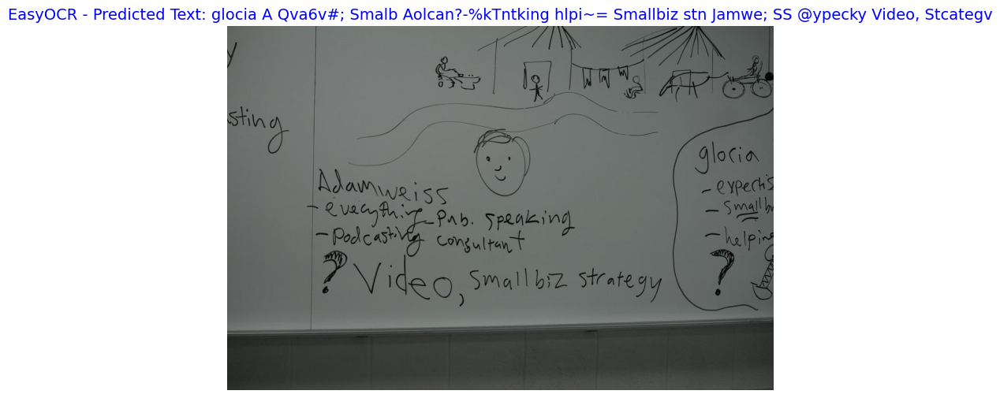

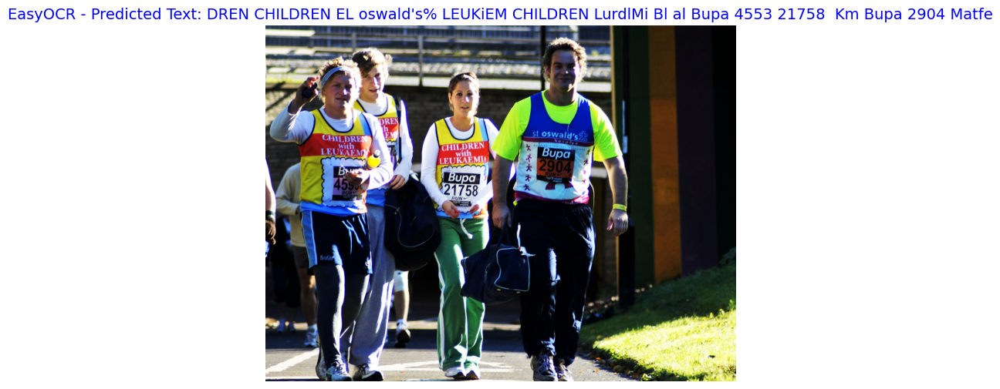

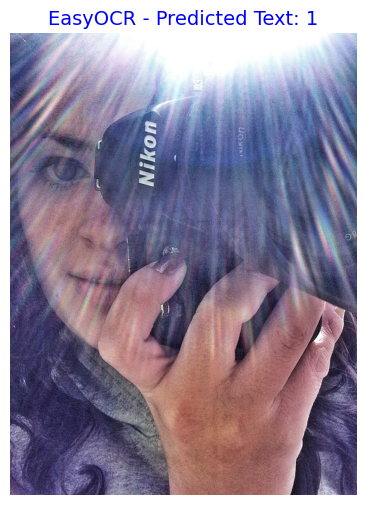

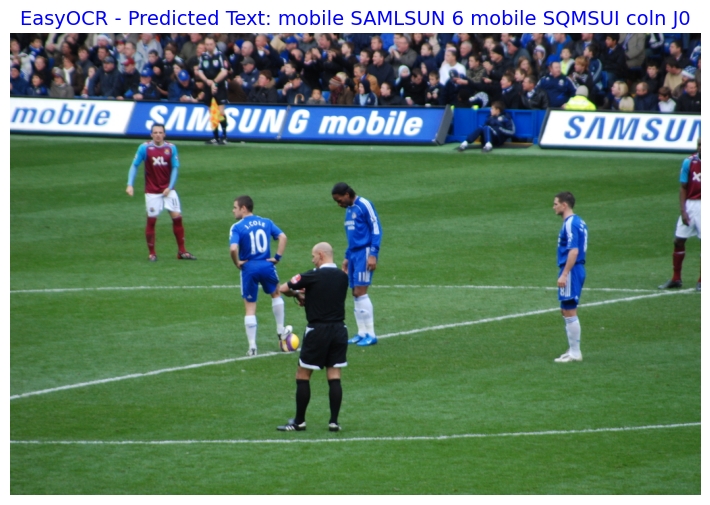

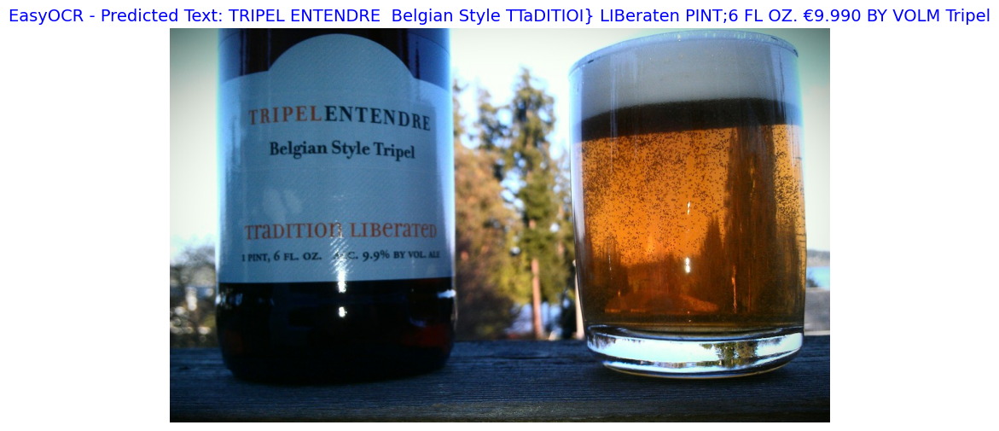


Visualizing TrOCR predictions for a few images...


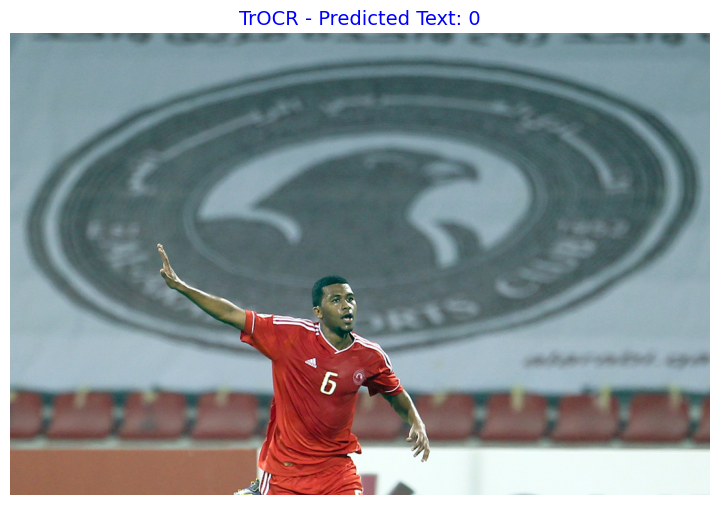

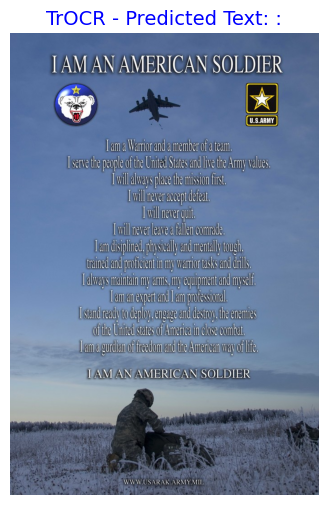

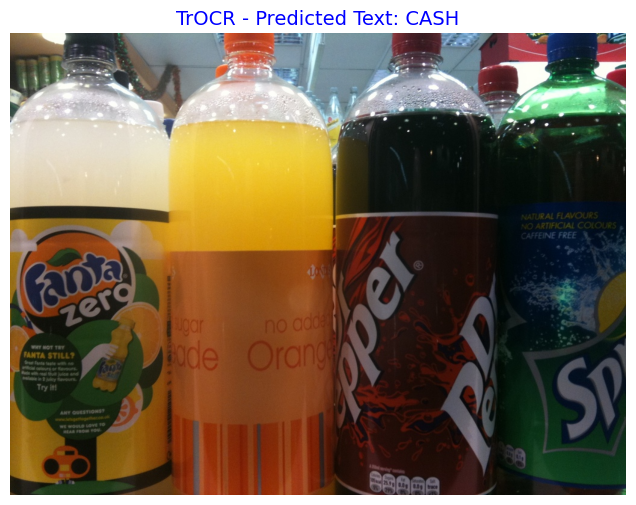

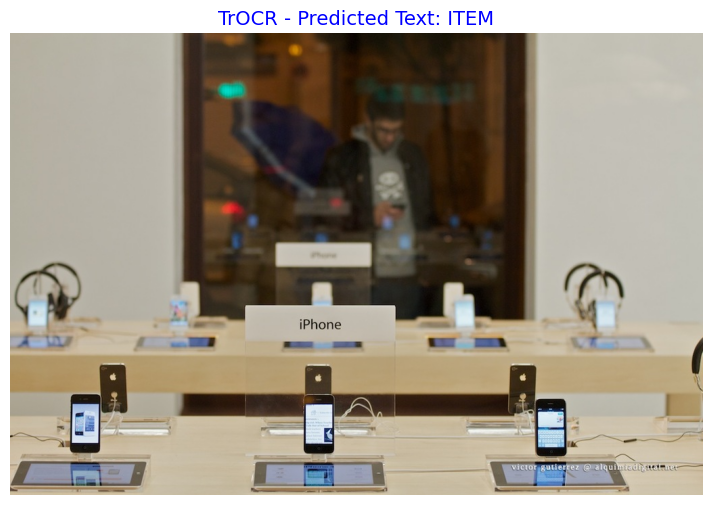

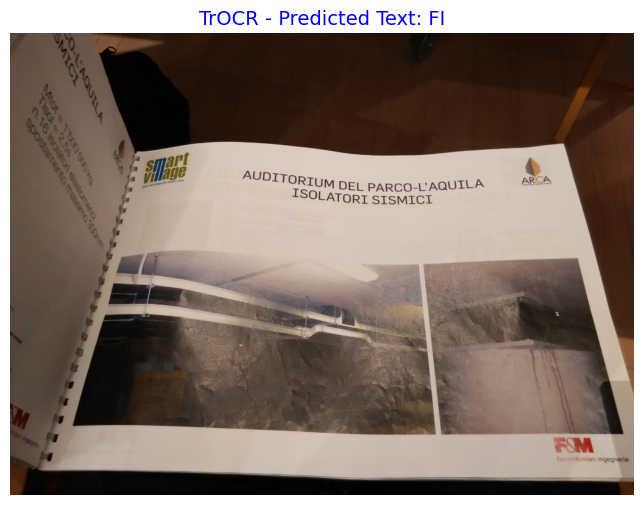

In [ ]:
# Display a few predictions alongside their original images for each OCR model
def visualize_predictions(reader, model_type, dataset, num_images=5):
    """
    Display the OCR predictions on a few sample images.
    """
    samples = random.sample(dataset, num_images)
    for image_path in samples:
        if model_type == "EasyOCR":
            result = reader.readtext(image_path, detail=0)  # Extract the recognized text
            predicted_text = ' '.join(result)
        elif model_type == "TrOCR":
            image = Image.open(image_path).convert("RGB")
            pixel_values = processor_trocr(images=image, return_tensors="pt").pixel_values
            generated_ids = model_trocr.generate(pixel_values)
            predicted_text = processor_trocr.batch_decode(generated_ids, skip_special_tokens=True)[0]
        else:
            raise ValueError("Invalid OCR model type specified.")

        # Load and display image with predicted text
        image = plt.imread(image_path)
        plt.figure(figsize=(10, 6))
        plt.imshow(image)
        plt.title(f"{model_type} - Predicted Text: {predicted_text}", fontsize=14, color='blue')
        plt.axis('off')
        plt.show()

print("\nVisualizing EasyOCR predictions for a few images...")
visualize_predictions(reader_easyocr, "EasyOCR", train_dataset, num_images=5)  # Display predictions for 5 images with EasyOCR

print("\nVisualizing TrOCR predictions for a few images...")
visualize_predictions(None, "TrOCR", train_dataset, num_images=5)  # Display predictions for 5 images with TrOCR

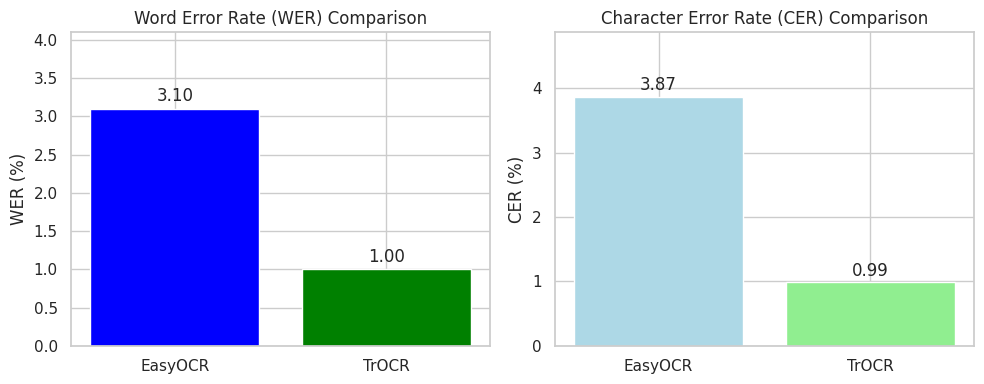

In [ ]:
# Evaluation results
results = {
    "Model": ["EasyOCR", "TrOCR"],
    "WER": [3.10, 1.00],
    "CER": [3.87, 0.99],
}

# Plotting the comparison
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Word Error Rate Comparison
axes[0].bar(results['Model'], results['WER'], color=['blue', 'green'])
axes[0].set_title('Word Error Rate (WER) Comparison')
axes[0].set_ylabel('WER (%)')
axes[0].set_ylim(0, max(results['WER']) + 1)

# Character Error Rate Comparison
axes[1].bar(results['Model'], results['CER'], color=['lightblue', 'lightgreen'])
axes[1].set_title('Character Error Rate (CER) Comparison')
axes[1].set_ylabel('CER (%)')
axes[1].set_ylim(0, max(results['CER']) + 1)

# Add labels to bars
for i, ax in enumerate(axes):
    for j, value in enumerate(results[list(results.keys())[i + 1]]):
        ax.text(j, value + 0.1, f"{value:.2f}", ha='center', fontsize=12)

plt.tight_layout()
plt.show()

*Note: Accuracy, Precision, Recall, and F1 Score are not typically used for OCR evaluations because they are better suited to classification tasks and don't account for the sequence-based nature of text output.*

### Model Results and Findings
The evaluation of two OCR models, **EasyOCR** and **TrOCR**, was conducted on a dataset of 2000 images, and their performances were compared using two key metrics: Word Error Rate (WER) and Character Error Rate (CER).

**TrOCR significantly outperformed EasyOCR** in both metrics, with a WER of 1.00% and a CER of 0.99%, compared to EasyOCR's WER of 3.10% and CER of 3.87%. This indicates that TrOCR was more accurate in recognizing both words and individual characters, likely due to its deep learning-based architecture leveraging pre-trained transformers. TrOCR showed notable accuracy in recognizing text even in challenging cases with varying fonts and backgrounds.

Despite EasyOCR's simplicity and speed, its predictions were often noisy, as evident in sample visualizations, where it struggled with distorted or handwritten text. EasyOCR's higher WER and CER reflect its limitations when dealing with complex text layouts or poor image quality, which TrOCR handled better. However, EasyOCR maintained good performance in simpler cases, suggesting it could still be a viable lightweight alternative for less complex tasks.

The results demonstrate that **TrOCR is more reliable for high-accuracy OCR tasks**, particularly in datasets with complex or noisy text. However, **EasyOCR's faster inference and lower resource demands make it suitable for simpler, real-time OCR applications.**